# Flower Generation Using DCGAN

DeepIntoDeep 과제 5는 "자유 주제로 토이 프로젝트를 진행"하는 것입니다.

강의와 과제에서 배운 내용을 바탕으로, 데이터셋과 모델을 정해 자유롭게 프로젝트를 완성하시면 됩니다.

과제 목표가 다소 추상적이기 때문에 강사진이 CV와 NLP 분야를 다루는 예시 프로젝트를 준비하였습니다.

본 노트북은 CV 분야의 예시 프로젝트로, 꽃 이미지 데이터셋과 DCGAN 모델을 활용하여 이미지 생성 태스크를 수행합니다.

다른 태스크에서도 활용할 수 있는 내용을 포함하고 있으니 과제 진행에 도움이 되길 바랍니다.

*(예: PyTorch로 데이터셋과 모델 코드 작성하기, 훈련 파이프라인 만들기, TensorBoard를 통해 훈련 과정 확인하기)*

## 태스크 정하기

프로젝트를 시작하려면 우선 어떤 태스크를 수행할지 정해야 할 것입니다.

자신의 관심 분야에 따라 원하시는 태스크를 수행하시면 됩니다.

태스크 목록은 DeepIntoDeep 강의 자료 혹은 아래 사이트에서 좌측 탭의 태스크 분류를 참고하시길 바랍니다.
- https://huggingface.co/models

## 데이터셋 준비하기

태스크를 정하셨다면 어떤 데이터셋을 학습시킬 것인지 찾아야 합니다.

다음 사이트에서 본인의 목적에 가장 맞는 데이터셋을 찾으시면 됩니다.
- https://pytorch.org/tutorials/beginner/basics/data_tutorial.html
- https://huggingface.co/datasets
- https://www.aihub.or.kr/

본 노트북에서는 여러 꽃 이미지로 구성된 Flowers102을 활용하겠습니다.
- https://pytorch.org/vision/stable/generated/torchvision.datasets.Flowers102.html#torchvision.datasets.Flowers102

In [1]:
# 데이터셋 다운로드하기
from torchvision.datasets import Flowers102

Flowers102(root="./data/", download=True)

100%|██████████| 344862509/344862509 [00:01<00:00, 183099868.57it/s]


Extracting data/flowers-102/102flowers.tgz to data/flowers-102


100%|██████████| 502/502 [00:00<00:00, 1559659.71it/s]


100%|██████████| 14989/14989 [00:00<00:00, 47092451.43it/s]


Dataset Flowers102
    Number of datapoints: 1020
    Root location: ./data/
    split=train

In [2]:
# 데이터셋이 어떻게 다운로드되었는지 확인해봅시다
!ls ./data/

flowers-102


In [3]:
!ls ./data/flowers-102/

102flowers.tgz	imagelabels.mat  jpg  setid.mat


In [4]:
# jpg 폴더 밑에 8189장의 이미지가 있습니다
!ls ./data/flowers-102/jpg/ | head
!ls ./data/flowers-102/jpg/ | wc -l

image_00001.jpg
image_00002.jpg
image_00003.jpg
image_00004.jpg
image_00005.jpg
image_00006.jpg
image_00007.jpg
image_00008.jpg
image_00009.jpg
image_00010.jpg
8189


In [5]:
# glob 패키지의 glob 함수를 활용하여 주어진 형식에 맞는 경로를 탐색할 수 있습니다
from glob import glob

filepaths = glob("./data/flowers-102/jpg/*.jpg")
len(filepaths), filepaths[0]

(8189, './data/flowers-102/jpg/image_05208.jpg')

In [6]:
# 파이토치 공식 문서를 참고하여 데이터셋 코드르 작성해봅시다
# https://pytorch.org/docs/stable/data.html#torch.utils.data.Dataset
import os
from PIL import Image as pil_image
from torch.utils.data import Dataset

class Flower102(Dataset):
    def __init__(self, root, transform=None):
        super(Flower102, self).__init__()
        self.transform = transform
        self.filepaths = glob(os.path.join(root, "flowers-102", "jpg", "*.jpg"))

    def __getitem__(self, index):
        image = pil_image.open(self.filepaths[index])
        if self.transform is not None:
            image = self.transform(image)
        return image

    def __len__(self):
        return len(self.filepaths)

In [7]:
# 작성한 데이터셋을 실행해봅시다
# 이때 추후 활용을 위해 이미지를 64x64 크기로 조정하고 값을 스케일링합시다
from torchvision import transforms as T

transform = T.Compose([
    T.Resize((64, 64)),
    T.ToTensor(),
    T.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
])
dataset = Flower102(root="./data/", transform=transform)
dataset[0]

tensor([[[-0.7569, -0.8588, -0.9294,  ..., -0.9216, -0.8980, -0.6941],
         [-0.8902, -0.9137, -0.9216,  ..., -0.9294, -0.8510, -0.5765],
         [-0.8980, -0.8667, -0.7176,  ..., -0.8353, -0.6314, -0.3725],
         ...,
         [-0.8510, -0.8353, -0.8667,  ..., -0.4196, -0.4431, -0.4902],
         [-0.8588, -0.8431, -0.8667,  ..., -0.4667, -0.4667, -0.4510],
         [-0.8824, -0.8510, -0.8510,  ..., -0.4510, -0.4667, -0.4510]],

        [[-0.7412, -0.8431, -0.8902,  ..., -0.8980, -0.8510, -0.6784],
         [-0.8510, -0.8824, -0.8902,  ..., -0.8980, -0.8039, -0.5529],
         [-0.8667, -0.8510, -0.7176,  ..., -0.7882, -0.5843, -0.3333],
         ...,
         [-0.8667, -0.8510, -0.8667,  ..., -0.5294, -0.5451, -0.5843],
         [-0.8667, -0.8510, -0.8588,  ..., -0.5765, -0.5686, -0.5608],
         [-0.8667, -0.8510, -0.8510,  ..., -0.5765, -0.5765, -0.5608]],

        [[-0.7961, -0.8980, -0.9451,  ..., -0.9529, -0.9373, -0.8588],
         [-0.9059, -0.9373, -0.9451,  ..., -0

In [8]:
# 파이토치 텐서 형태로 된 이미지를 보기 좋게 출력하는 함수를 만들어봅시다
from matplotlib import pyplot as plt
from torchvision.transforms import functional as TF
from torchvision.utils import make_grid

def plot_image_tensor(tensor):
    tensor = make_grid(tensor, nrow=1, normalize=True)
    image = TF.to_pil_image(tensor)
    plt.imshow(image)
    plt.axis("off")

def plot_image_tensors(tensors, num_rows):
    tensors = make_grid(tensors, num_rows, normalize=True)
    image = TF.to_pil_image(tensors)
    plt.imshow(image)
    plt.axis("off")

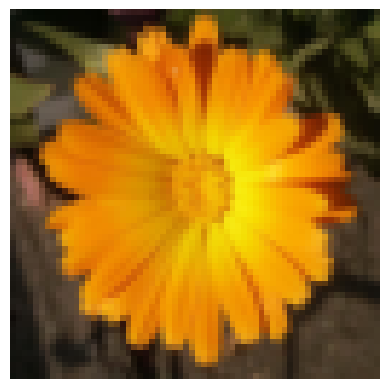

In [9]:
plot_image_tensor(dataset[0])

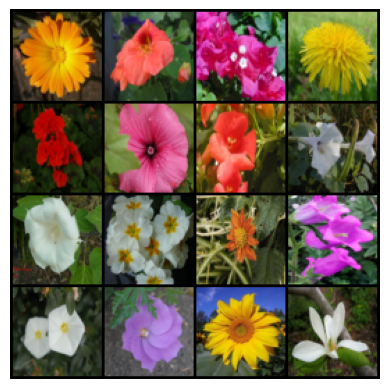

In [10]:
from torchvision.utils import make_grid

plot_image_tensors([dataset[i] for i in range(16)], num_rows=4)

## 모델 만들기

데이터셋을 학습할 모델을 만들 차례입니다.

DeepIntoDeep 강의 자료나 구글링을 통해 적절한 모델을 찾아보세요.
- https://pytorch.org/vision/stable/models.html
- https://huggingface.co/models
- https://timm.fast.ai/

라이브러리 형태로 주어진 모델을 사용해도 되고, 직접 구현해도 됩니다.

여기서는 GAN의 초기 대표 모델 중 하나인 DCGAN을 직접 구현해보겠습니다.
- https://arxiv.org/abs/1511.06434

모델 구조는 논문과 관련 자료를 참고하여 결정했습니다.


In [11]:
# DCGAN의 판별기 (discriminator)
from torch import nn

class DCDiscriminator(nn.Module):
    def __init__(self):
        super(DCDiscriminator, self).__init__()

        self.layers = nn.Sequential(
            # block 1
            nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # block 2
            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),
            # block 3
            nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),
            # block 4
            nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2, inplace=True),
            # block 5,
            nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=0, bias=False),
            nn.Sigmoid(),
        )

    def forward(self, x):
        return self.layers(x)

In [12]:
# DCGAN의 생성기 (generator)
class DCGenerator(nn.Module):
    def __init__(self, latent_dim):
        super(DCGenerator, self).__init__()

        self.layers = nn.Sequential(
            # block 1
            nn.ConvTranspose2d(latent_dim, 512, kernel_size=4, stride=1, padding=0, bias=False),
            nn.BatchNorm2d(512),
            nn.ReLU(inplace=True),
            # block 2
            nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),
            # block 3
            nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
            # block 4
            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            # block 5
            nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1, bias=False),
            nn.Tanh(),
        )

    def forward(self, x):
        return self.layers(x)

In [13]:
# DCGAN
import torch

class DCGAN(nn.Module):
    def __init__(self, latent_dim):
        super(DCGAN, self).__init__()
        self.latent_dim = latent_dim

        self.discriminator = DCDiscriminator()
        self.generator = DCGenerator(latent_dim)

    def generate(self, latent):
        return self.generator(latent)

    def discriminate(self, x):
        return self.discriminator(x)

## 훈련 과정 준비하기

훈련 과정에서 쓰일 함수를 작성해봅시다.

꼭 필요한 과정은 아니지만 가독성 좋은 코드를 작성하기 위해 복잡한 부분을 함수화하겠습니다.

In [14]:
# DCGAN의 판별기와 생성기에 대한 손실 함수
from torch.nn import functional as F

def discriminator_loss(real_probs, fake_probs):
    # 실제 이미지를 진짜 (real, 1) 로 판별했는지
    real_labels = torch.ones_like(real_probs)
    real_loss = F.binary_cross_entropy(real_probs, real_labels)

    # 생성된 이미지를 가짜 (fake, 0) 로 판별했는지
    fake_labels = torch.zeros_like(fake_probs)
    fake_loss = F.binary_cross_entropy(fake_probs, fake_labels)

    return real_loss + fake_loss

def generator_loss(fake_probs):
    # 생성된 이미지를 진짜 (real, 1) 로 판별했는지 = 판별기를 잘 속였는지
    real_labels = torch.ones_like(fake_probs)
    return F.binary_cross_entropy(fake_probs, real_labels)

In [15]:
# 데이터셋을 한 번 훑는 것을 1 에폭 (epoch) 이라고 하죠
# 데이터셋을 1 에폭 학습하는 과정을 함수화합니다
from tqdm import tqdm

def training_epoch(model, dataloader, d_optimizer, g_optimizer):
    avg_d_loss, avg_g_loss = 0.0, 0.0
    for real_images in tqdm(dataloader, desc="    Training"):
        batch_size = real_images.size(0)

        d_optimizer.zero_grad()

        # 실제 이미지와 생성된 이미지를 판별한 후
        real_probs = model.discriminate(real_images.cuda())
        latent = torch.randn(batch_size, model.latent_dim, 1, 1).cuda()
        fake_images = model.generate(latent)
        fake_probs = model.discriminate(fake_images.detach())

        # 판별기를 업데이트합니다
        d_loss = discriminator_loss(real_probs, fake_probs)
        d_loss.backward()
        d_optimizer.step()

        # 생성된 이미지를 판별한 후
        g_optimizer.zero_grad()
        latent = torch.randn(batch_size, model.latent_dim, 1, 1).cuda()
        fake_images = model.generate(latent)
        fake_probs = model.discriminate(fake_images)

        # 생성기를 업데이트합니다
        g_loss = generator_loss(fake_probs)
        g_loss.backward()
        g_optimizer.step()

        avg_d_loss += d_loss.item()
        avg_g_loss += g_loss.item()

    avg_d_loss /= len(dataloader)
    avg_g_loss /= len(dataloader)
    return avg_d_loss, avg_g_loss

## 훈련하기

데이터셋과 모델이 모두 준비되었으니 학습을 진행해봅시다.

In [ ]:
# 아래의 하이퍼파라미터 (batch_size, latent_dim, learning_rate, num_epochs)
# 의 값을 정하여 훈련 과정을 진행해봅시다
from torch import optim
from torch.utils.data import DataLoader

batch_size = 256
latent_dim = 100
learning_rate = 2e-4
num_epochs = 100

dataloader = DataLoader(dataset, batch_size, shuffle=True, drop_last=True)

model = DCGAN(latent_dim).cuda()
d_optimizer = optim.Adam(model.discriminator.parameters(), learning_rate, betas=(0.5, 0.999))
g_optimizer = optim.Adam(model.generator.parameters(), learning_rate, betas=(0.5, 0.999))

d_losses, g_losses, = [], []
for epoch in range(num_epochs):
    print("Epoch %d" % (epoch + 1))
    model.train()
    d_loss, g_loss = training_epoch(model, dataloader, d_optimizer, g_optimizer)

    print("    Loss: D (%.4f) G (%.4f)" % (d_loss, g_loss))
    d_losses.append(d_loss)
    g_losses.append(g_loss)

Epoch 1


    Training: 100%|██████████| 31/31 [00:46<00:00,  1.50s/it]


    Loss: D (0.5408) G (9.6825)
Epoch 2


    Training: 100%|██████████| 31/31 [00:41<00:00,  1.35s/it]


    Loss: D (0.6233) G (11.2129)
Epoch 3


    Training: 100%|██████████| 31/31 [00:51<00:00,  1.66s/it]


    Loss: D (0.7240) G (4.7698)
Epoch 4


    Training: 100%|██████████| 31/31 [00:43<00:00,  1.41s/it]


    Loss: D (0.7435) G (3.4383)
Epoch 5


    Training: 100%|██████████| 31/31 [00:40<00:00,  1.31s/it]


    Loss: D (0.8294) G (2.2795)
Epoch 6


    Training: 100%|██████████| 31/31 [00:45<00:00,  1.48s/it]


    Loss: D (1.0276) G (2.0493)
Epoch 7


    Training: 100%|██████████| 31/31 [00:39<00:00,  1.27s/it]


    Loss: D (0.9835) G (2.0514)
Epoch 8


    Training: 100%|██████████| 31/31 [00:36<00:00,  1.18s/it]


    Loss: D (0.9615) G (2.0834)
Epoch 9


    Training: 100%|██████████| 31/31 [00:39<00:00,  1.28s/it]


    Loss: D (1.0073) G (2.4381)
Epoch 10


    Training: 100%|██████████| 31/31 [00:40<00:00,  1.31s/it]


    Loss: D (0.9869) G (2.6318)
Epoch 11


    Training: 100%|██████████| 31/31 [00:34<00:00,  1.12s/it]


    Loss: D (0.9361) G (2.5733)
Epoch 12


    Training: 100%|██████████| 31/31 [00:36<00:00,  1.17s/it]


    Loss: D (0.9628) G (2.4445)
Epoch 13


    Training: 100%|██████████| 31/31 [00:47<00:00,  1.52s/it]


    Loss: D (0.9136) G (2.3674)
Epoch 14


    Training: 100%|██████████| 31/31 [00:40<00:00,  1.31s/it]


    Loss: D (0.8772) G (2.2162)
Epoch 15


    Training: 100%|██████████| 31/31 [00:43<00:00,  1.41s/it]


    Loss: D (0.9146) G (2.6537)
Epoch 16


    Training: 100%|██████████| 31/31 [00:37<00:00,  1.21s/it]


    Loss: D (0.8776) G (2.6530)
Epoch 17


    Training: 100%|██████████| 31/31 [00:45<00:00,  1.47s/it]


    Loss: D (0.7885) G (2.8945)
Epoch 18


    Training: 100%|██████████| 31/31 [00:36<00:00,  1.19s/it]


    Loss: D (0.8493) G (2.7993)
Epoch 19


    Training: 100%|██████████| 31/31 [00:40<00:00,  1.32s/it]


    Loss: D (0.8053) G (2.9503)
Epoch 20


    Training: 100%|██████████| 31/31 [00:38<00:00,  1.24s/it]


    Loss: D (0.7245) G (2.8971)
Epoch 21


    Training: 100%|██████████| 31/31 [00:44<00:00,  1.43s/it]


    Loss: D (0.7908) G (2.8950)
Epoch 22


    Training: 100%|██████████| 31/31 [00:37<00:00,  1.21s/it]


    Loss: D (0.7922) G (3.0521)
Epoch 23


    Training: 100%|██████████| 31/31 [00:34<00:00,  1.12s/it]


    Loss: D (0.8412) G (2.7553)
Epoch 24


    Training: 100%|██████████| 31/31 [00:51<00:00,  1.67s/it]


    Loss: D (0.8867) G (2.8992)
Epoch 25


    Training: 100%|██████████| 31/31 [00:44<00:00,  1.42s/it]


    Loss: D (0.7417) G (2.8953)
Epoch 26


    Training: 100%|██████████| 31/31 [00:35<00:00,  1.16s/it]


    Loss: D (0.8283) G (2.8518)
Epoch 27


    Training: 100%|██████████| 31/31 [00:41<00:00,  1.35s/it]


    Loss: D (0.8805) G (2.8847)
Epoch 28


    Training: 100%|██████████| 31/31 [00:37<00:00,  1.21s/it]


    Loss: D (0.8531) G (2.8975)
Epoch 29


    Training: 100%|██████████| 31/31 [00:35<00:00,  1.13s/it]


    Loss: D (0.9186) G (2.9443)
Epoch 30


    Training: 100%|██████████| 31/31 [00:35<00:00,  1.16s/it]


    Loss: D (0.8065) G (2.8463)
Epoch 31


    Training: 100%|██████████| 31/31 [00:34<00:00,  1.12s/it]


    Loss: D (0.8553) G (2.7635)
Epoch 32


    Training: 100%|██████████| 31/31 [00:35<00:00,  1.15s/it]


    Loss: D (0.8299) G (2.8652)
Epoch 33


    Training: 100%|██████████| 31/31 [00:35<00:00,  1.14s/it]


    Loss: D (0.8462) G (2.8118)
Epoch 34


    Training: 100%|██████████| 31/31 [00:34<00:00,  1.12s/it]


    Loss: D (0.8187) G (2.7630)
Epoch 35


    Training: 100%|██████████| 31/31 [00:35<00:00,  1.13s/it]


    Loss: D (0.8770) G (2.7495)
Epoch 36


    Training: 100%|██████████| 31/31 [00:35<00:00,  1.15s/it]


    Loss: D (0.8366) G (2.7751)
Epoch 37


    Training: 100%|██████████| 31/31 [00:36<00:00,  1.16s/it]


    Loss: D (0.7697) G (2.7704)
Epoch 38


    Training: 100%|██████████| 31/31 [00:34<00:00,  1.11s/it]


    Loss: D (0.8544) G (2.6898)
Epoch 39


    Training: 100%|██████████| 31/31 [00:34<00:00,  1.11s/it]


    Loss: D (0.8277) G (2.8183)
Epoch 40


    Training: 100%|██████████| 31/31 [00:34<00:00,  1.13s/it]


    Loss: D (0.8529) G (2.7624)
Epoch 41


    Training: 100%|██████████| 31/31 [00:34<00:00,  1.10s/it]


    Loss: D (0.7596) G (2.7968)
Epoch 42


    Training: 100%|██████████| 31/31 [00:33<00:00,  1.10s/it]


    Loss: D (0.8213) G (2.8639)
Epoch 43


    Training: 100%|██████████| 31/31 [00:33<00:00,  1.10s/it]


    Loss: D (0.7552) G (2.8311)
Epoch 44


    Training: 100%|██████████| 31/31 [00:34<00:00,  1.10s/it]


    Loss: D (0.8017) G (2.9221)
Epoch 45


    Training: 100%|██████████| 31/31 [00:34<00:00,  1.11s/it]


    Loss: D (0.7771) G (2.7867)
Epoch 46


    Training: 100%|██████████| 31/31 [00:33<00:00,  1.08s/it]


    Loss: D (0.7839) G (3.0999)
Epoch 47


    Training: 100%|██████████| 31/31 [00:34<00:00,  1.11s/it]


    Loss: D (0.6493) G (2.8987)
Epoch 48


    Training: 100%|██████████| 31/31 [00:35<00:00,  1.16s/it]


    Loss: D (0.8228) G (2.9711)
Epoch 49


    Training: 100%|██████████| 31/31 [00:33<00:00,  1.09s/it]


    Loss: D (0.6856) G (2.9225)
Epoch 50


    Training: 100%|██████████| 31/31 [00:34<00:00,  1.12s/it]


    Loss: D (0.6947) G (3.0055)
Epoch 51


    Training: 100%|██████████| 31/31 [00:34<00:00,  1.12s/it]


    Loss: D (0.7628) G (2.8043)
Epoch 52


    Training: 100%|██████████| 31/31 [00:34<00:00,  1.13s/it]


    Loss: D (0.6620) G (2.7188)
Epoch 53


    Training: 100%|██████████| 31/31 [00:33<00:00,  1.09s/it]


    Loss: D (0.7568) G (2.9399)
Epoch 54


    Training: 100%|██████████| 31/31 [00:35<00:00,  1.13s/it]


    Loss: D (0.7238) G (2.7748)
Epoch 55


    Training: 100%|██████████| 31/31 [00:34<00:00,  1.12s/it]


    Loss: D (0.6962) G (2.9028)
Epoch 56


    Training: 100%|██████████| 31/31 [00:35<00:00,  1.15s/it]


    Loss: D (0.8733) G (2.8285)
Epoch 57


    Training: 100%|██████████| 31/31 [00:35<00:00,  1.15s/it]


    Loss: D (0.7007) G (2.7183)
Epoch 58


    Training: 100%|██████████| 31/31 [00:33<00:00,  1.09s/it]


    Loss: D (0.6195) G (2.7918)
Epoch 59


    Training: 100%|██████████| 31/31 [00:34<00:00,  1.13s/it]


    Loss: D (0.7330) G (2.7910)
Epoch 60


    Training: 100%|██████████| 31/31 [00:35<00:00,  1.14s/it]


    Loss: D (0.6604) G (2.7498)
Epoch 61


    Training: 100%|██████████| 31/31 [00:35<00:00,  1.13s/it]


    Loss: D (0.7875) G (2.7949)
Epoch 62


    Training: 100%|██████████| 31/31 [00:33<00:00,  1.09s/it]


    Loss: D (0.6163) G (2.6054)
Epoch 63


    Training: 100%|██████████| 31/31 [00:34<00:00,  1.13s/it]


    Loss: D (0.8841) G (2.7666)
Epoch 64


    Training: 100%|██████████| 31/31 [00:35<00:00,  1.13s/it]


    Loss: D (0.7919) G (2.9235)
Epoch 65


    Training: 100%|██████████| 31/31 [00:36<00:00,  1.18s/it]


    Loss: D (0.6906) G (2.5686)
Epoch 66


    Training: 100%|██████████| 31/31 [00:34<00:00,  1.10s/it]


    Loss: D (0.6617) G (2.6871)
Epoch 67


    Training: 100%|██████████| 31/31 [00:34<00:00,  1.11s/it]


    Loss: D (0.6789) G (2.6679)
Epoch 68


    Training: 100%|██████████| 31/31 [00:34<00:00,  1.11s/it]


    Loss: D (0.7167) G (2.7144)
Epoch 69


    Training: 100%|██████████| 31/31 [00:34<00:00,  1.12s/it]


    Loss: D (0.6926) G (2.6667)
Epoch 70


    Training: 100%|██████████| 31/31 [00:34<00:00,  1.12s/it]


    Loss: D (0.6165) G (2.5840)
Epoch 71


    Training: 100%|██████████| 31/31 [00:34<00:00,  1.11s/it]


    Loss: D (0.7605) G (2.7584)
Epoch 72


    Training: 100%|██████████| 31/31 [00:34<00:00,  1.10s/it]


    Loss: D (0.8150) G (2.6709)
Epoch 73


    Training: 100%|██████████| 31/31 [00:34<00:00,  1.12s/it]


    Loss: D (0.6675) G (2.5092)
Epoch 74


    Training: 100%|██████████| 31/31 [00:34<00:00,  1.11s/it]


    Loss: D (0.7062) G (2.5814)
Epoch 75


    Training: 100%|██████████| 31/31 [00:34<00:00,  1.10s/it]


    Loss: D (0.7798) G (2.5266)
Epoch 76


    Training: 100%|██████████| 31/31 [00:34<00:00,  1.12s/it]


    Loss: D (0.6235) G (2.4384)
Epoch 77


    Training: 100%|██████████| 31/31 [00:36<00:00,  1.16s/it]


    Loss: D (0.7996) G (2.7204)
Epoch 78


    Training: 100%|██████████| 31/31 [00:34<00:00,  1.12s/it]


    Loss: D (0.8107) G (2.5852)
Epoch 79


    Training: 100%|██████████| 31/31 [00:34<00:00,  1.10s/it]


    Loss: D (0.6864) G (2.5100)
Epoch 80


    Training: 100%|██████████| 31/31 [00:34<00:00,  1.11s/it]


    Loss: D (0.7345) G (2.5642)
Epoch 81


    Training: 100%|██████████| 31/31 [00:35<00:00,  1.14s/it]


    Loss: D (0.6663) G (2.4890)
Epoch 82


    Training: 100%|██████████| 31/31 [00:35<00:00,  1.13s/it]


    Loss: D (0.7753) G (2.5996)
Epoch 83


    Training: 100%|██████████| 31/31 [00:35<00:00,  1.14s/it]


    Loss: D (0.6780) G (2.4134)
Epoch 84


    Training: 100%|██████████| 31/31 [00:33<00:00,  1.08s/it]


    Loss: D (0.6884) G (2.4978)
Epoch 85


    Training: 100%|██████████| 31/31 [00:35<00:00,  1.14s/it]


    Loss: D (0.6185) G (2.3447)
Epoch 86


    Training: 100%|██████████| 31/31 [00:34<00:00,  1.11s/it]


    Loss: D (1.0927) G (2.5020)
Epoch 87


    Training: 100%|██████████| 31/31 [00:34<00:00,  1.13s/it]


    Loss: D (0.6628) G (2.3157)
Epoch 88


    Training: 100%|██████████| 31/31 [00:34<00:00,  1.13s/it]


    Loss: D (0.6169) G (2.3850)
Epoch 89


    Training: 100%|██████████| 31/31 [00:35<00:00,  1.15s/it]


    Loss: D (0.7616) G (2.5145)
Epoch 90


    Training: 100%|██████████| 31/31 [00:36<00:00,  1.17s/it]


    Loss: D (0.6039) G (2.4755)
Epoch 91


    Training: 100%|██████████| 31/31 [00:34<00:00,  1.13s/it]


    Loss: D (0.7066) G (2.6326)
Epoch 92


    Training: 100%|██████████| 31/31 [00:35<00:00,  1.15s/it]


    Loss: D (0.6150) G (2.4669)
Epoch 93


    Training: 100%|██████████| 31/31 [00:34<00:00,  1.10s/it]


    Loss: D (0.6513) G (2.5932)
Epoch 94


    Training: 100%|██████████| 31/31 [00:35<00:00,  1.13s/it]


    Loss: D (0.8728) G (2.5854)
Epoch 95


    Training: 100%|██████████| 31/31 [00:36<00:00,  1.17s/it]


    Loss: D (0.6156) G (2.4759)
Epoch 96


    Training: 100%|██████████| 31/31 [00:34<00:00,  1.13s/it]


    Loss: D (0.5743) G (2.5848)
Epoch 97


    Training: 100%|██████████| 31/31 [00:35<00:00,  1.14s/it]


    Loss: D (0.7525) G (2.6011)
Epoch 98


    Training: 100%|██████████| 31/31 [00:34<00:00,  1.12s/it]


    Loss: D (0.6207) G (2.5100)
Epoch 99


    Training: 100%|██████████| 31/31 [00:35<00:00,  1.14s/it]


    Loss: D (0.5484) G (2.5091)
Epoch 100


    Training: 100%|██████████| 31/31 [00:35<00:00,  1.15s/it]

    Loss: D (0.5205) G (2.5330)


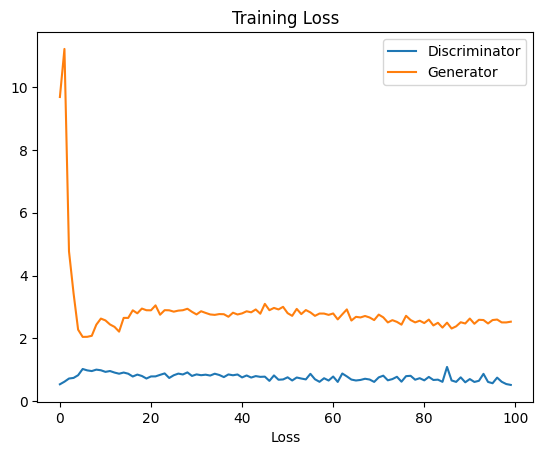

In [ ]:
# 훈련 과정에서 판별기와 생성기의 손실 함수 값들이 어떻게 변화하는지 확인해봅시다
plt.title("Training Loss")
plt.plot(d_losses, label="Discriminator")
plt.plot(g_losses, label="Generator")
plt.xlabel("Epoch")
plt.xlabel("Loss")
plt.legend()
plt.show()

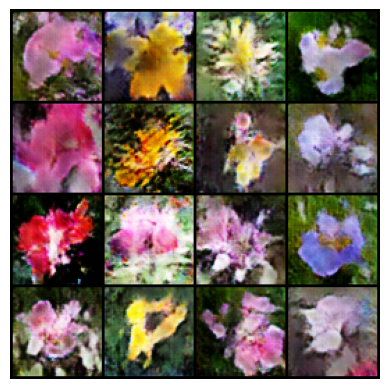

In [ ]:
# 훈련이 다 된 DCGAN이 어떤 이미지를 생성해내는지 확인해봅시다
model.eval()
with torch.no_grad():
    latent = torch.randn(16, latent_dim, 1, 1).cuda()
    images = model.generate(latent).cpu()
plot_image_tensors(images, num_rows=4)

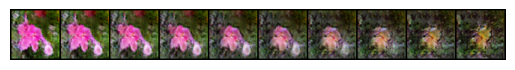

In [ ]:
# Latent interpolation을 직접 해볼까요?
latent1 = torch.randn(1, latent_dim, 1, 1).cuda()
latent2 = torch.randn(1, latent_dim, 1, 1).cuda()

model.eval()
with torch.no_grad():
    images = []
    for i in range(10):
        latent = (i * latent1 + (10 - i) * latent2) / 10
        image = model.generate(latent).cpu()
        images.append(image)
images = torch.cat(images, dim=0)
plot_image_tensors(images, num_rows=10)

## 텐서보드로 훈련 과정 이해하기

텐서보드는 머신러닝 실험 과정에서 다양한 값을 시각화하고 훈련 과정을 이해하는 데에 유용한 라이브러리입니다.

파이토치에서는 `SummaryWriter` 클래스를 통해 텐서보드를 쉽게 사용할 수 있도록 합니다.
- https://pytorch.org/docs/stable/tensorboard.html

훈련 과정에 텐서보드를 포함해서 보기 좋기 훈련해봅시다.

In [16]:
!pip install jupyter-tensorboard

  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 13.1 MB/s eta 0:00:00
  Created wheel for jupyter-tensorboard: filename=jupyter_tensorboard-0.2.0-py2.py3-none-any.whl size=15243 sha256=ef282617062008f0874d8c9cb28d6b20596541164e1feb32c0c03cb89aaca189
  Stored in directory: /root/.cache/pip/wheels/6a/e8/ee/64103cb21821f6a747a19b93a417b7e925857daab8ec5c7f50
Successfully built jupyter-tensorboard


In [17]:
# DCGAN
import torch

class DCGAN(nn.Module):
    def __init__(self, latent_dim):
        super(DCGAN, self).__init__()
        self.latent_dim = latent_dim

        self.discriminator = DCDiscriminator()
        self.generator = DCGenerator(latent_dim)

    def forward(self, latent):
        # for tensorboard
        return self.discriminator(self.generator(latent))

    def generate(self, latent):
        return self.generator(latent)

    def discriminate(self, x):
        return self.discriminator(x)

In [18]:
%load_ext tensorboard

다음 코드를 실행시켰을 때 아래 같은 화면이 나타나면 됩니다.

다소 시간이 걸릴 수 있습니다.
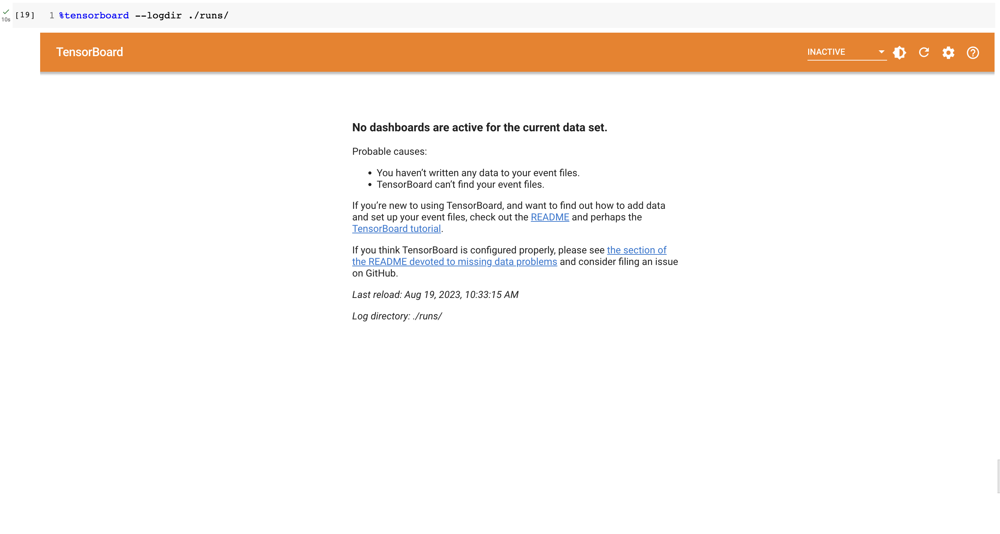

In [19]:
%tensorboard --logdir ./runs/

<IPython.core.display.Javascript object>

텐서보드 이용 방법
- 텐서보드 화면의 우측 상단에 있는 설정에서 "Reload data" 항목을 체크하세요. 훈련 과정에서 텐서보드 화면이 자동으로 새로고침됩니다.
- 좌측 상단의 탭 중 "TIME SERIES"에서 훈련 과정에서 지속적으로 업데이트되는 값을 확인할 수 있습니다. (예: 예시 사진, d_loss, g_loss)
- 좌측 상단의 탭 중 "IMAGES"에서 동일한 잠재 벡터로 생성한 이미지가 훈련 과정에서 어떻게 업데이트되는지 확인할 수 있습니다.
- 좌측 상단의 탭 중 "GRAPHS"에서 사용한 네트워크의 구조를 그래프 형태로 확인할 수 있습니다.
- 좌측 상단의 탭 중 "HPARAMS"에서 훈련 과정에서 사용한 하이퍼파라미터의 값을 확인할 수 있습니다.

In [ ]:
from torch.utils.tensorboard import SummaryWriter

batch_size = 1024
latent_dim = 100
learning_rate = 2e-4
num_epochs = 100

dataloader = DataLoader(dataset, batch_size, shuffle=True, drop_last=True)

model = DCGAN(latent_dim).cuda()
d_optimizer = optim.Adam(model.discriminator.parameters(), learning_rate, betas=(0.5, 0.999))
g_optimizer = optim.Adam(model.generator.parameters(), learning_rate, betas=(0.5, 0.999))
fixed_latents = torch.randn(16, latent_dim, 1, 1).cuda()

writer = SummaryWriter()
writer.add_graph(model, fixed_latents)

for epoch in range(num_epochs):
    print("Epoch %d" % (epoch + 1))
    model.train()
    d_loss, g_loss = training_epoch(model, dataloader, d_optimizer, g_optimizer)

    print("    Loss: D (%.4f) G (%.4f)" % (d_loss, g_loss))
    num_steps = epoch * len(dataloader)
    writer.add_scalar("d_loss", d_loss, num_steps)
    writer.add_scalar("g_loss", g_loss, num_steps)

    model.eval()
    with torch.no_grad():
        images = model.generate(fixed_latents).cpu()
        images = make_grid(images, nrow=4, normalize=True)
        # images = TF.to_pil_image(images)
        writer.add_image("Generated", images, num_steps)

writer.add_hparams({
    "batch_size": batch_size,
    "latent_dim": latent_dim,
    "learning_rate": learning_rate,
    "num_epochs": num_epochs,
}, {
    "d_loss": d_loss,
    "g_loss": g_loss,
})

writer.close()

Epoch 1


    Training: 100%|██████████| 7/7 [00:33<00:00,  4.81s/it]


    Loss: D (0.9989) G (4.5890)
Epoch 2


    Training: 100%|██████████| 7/7 [00:38<00:00,  5.48s/it]


    Loss: D (0.4307) G (7.6279)
Epoch 3


    Training: 100%|██████████| 7/7 [00:38<00:00,  5.49s/it]


    Loss: D (0.3935) G (11.2770)
Epoch 4


    Training: 100%|██████████| 7/7 [00:36<00:00,  5.20s/it]


    Loss: D (0.5206) G (10.7244)
Epoch 5


    Training: 100%|██████████| 7/7 [00:31<00:00,  4.50s/it]


    Loss: D (0.4893) G (12.3151)
Epoch 6


    Training: 100%|██████████| 7/7 [00:31<00:00,  4.43s/it]


    Loss: D (0.4242) G (12.8505)
Epoch 7


    Training: 100%|██████████| 7/7 [00:29<00:00,  4.25s/it]


    Loss: D (0.2662) G (11.4132)
Epoch 8


    Training: 100%|██████████| 7/7 [00:29<00:00,  4.22s/it]


    Loss: D (0.3064) G (11.6500)
Epoch 9


    Training: 100%|██████████| 7/7 [00:31<00:00,  4.57s/it]


    Loss: D (0.7161) G (9.9839)
Epoch 10


    Training: 100%|██████████| 7/7 [00:29<00:00,  4.26s/it]


    Loss: D (1.0152) G (9.8181)
Epoch 11


    Training: 100%|██████████| 7/7 [00:29<00:00,  4.24s/it]


    Loss: D (0.3233) G (6.9010)
Epoch 12


    Training: 100%|██████████| 7/7 [00:30<00:00,  4.41s/it]


    Loss: D (0.8582) G (5.9099)
Epoch 13


    Training: 100%|██████████| 7/7 [00:30<00:00,  4.32s/it]


    Loss: D (0.5153) G (4.2988)
Epoch 14


    Training: 100%|██████████| 7/7 [00:30<00:00,  4.34s/it]


    Loss: D (0.3794) G (3.5827)
Epoch 15


    Training: 100%|██████████| 7/7 [00:30<00:00,  4.32s/it]


    Loss: D (0.9720) G (3.8413)
Epoch 16


    Training: 100%|██████████| 7/7 [00:31<00:00,  4.43s/it]


    Loss: D (0.2770) G (3.3538)
Epoch 17


    Training: 100%|██████████| 7/7 [00:29<00:00,  4.20s/it]


    Loss: D (0.6634) G (3.3835)
Epoch 18


    Training: 100%|██████████| 7/7 [00:29<00:00,  4.26s/it]


    Loss: D (1.0346) G (3.0796)
Epoch 19


    Training: 100%|██████████| 7/7 [00:29<00:00,  4.19s/it]


    Loss: D (0.8276) G (2.5386)
Epoch 20


    Training: 100%|██████████| 7/7 [00:30<00:00,  4.42s/it]


    Loss: D (1.2329) G (2.1800)
Epoch 21


    Training: 100%|██████████| 7/7 [00:31<00:00,  4.47s/it]


    Loss: D (0.6833) G (2.0082)
Epoch 22


    Training: 100%|██████████| 7/7 [00:29<00:00,  4.25s/it]


    Loss: D (0.6632) G (2.6397)
Epoch 23


    Training: 100%|██████████| 7/7 [00:31<00:00,  4.57s/it]


    Loss: D (0.8616) G (3.3648)
Epoch 24


    Training: 100%|██████████| 7/7 [00:29<00:00,  4.25s/it]


    Loss: D (0.7626) G (3.6766)
Epoch 25


    Training: 100%|██████████| 7/7 [00:29<00:00,  4.26s/it]


    Loss: D (0.6399) G (2.9965)
Epoch 26


    Training: 100%|██████████| 7/7 [00:30<00:00,  4.36s/it]


    Loss: D (0.6261) G (2.8761)
Epoch 27


    Training: 100%|██████████| 7/7 [00:30<00:00,  4.35s/it]


    Loss: D (0.7876) G (3.4896)
Epoch 28


    Training: 100%|██████████| 7/7 [00:29<00:00,  4.16s/it]


    Loss: D (0.9257) G (3.0840)
Epoch 29


    Training: 100%|██████████| 7/7 [00:30<00:00,  4.37s/it]


    Loss: D (1.0764) G (2.2564)
Epoch 30


    Training: 100%|██████████| 7/7 [00:29<00:00,  4.20s/it]


    Loss: D (0.8730) G (2.6324)
Epoch 31


    Training: 100%|██████████| 7/7 [00:30<00:00,  4.40s/it]


    Loss: D (0.7850) G (2.5140)
Epoch 32


    Training: 100%|██████████| 7/7 [00:30<00:00,  4.35s/it]


    Loss: D (0.9887) G (2.8752)
Epoch 33


    Training: 100%|██████████| 7/7 [00:29<00:00,  4.23s/it]


    Loss: D (1.3024) G (2.5681)
Epoch 34


    Training:  43%|████▎     | 3/7 [00:13<00:18,  4.65s/it]